# Building dashboards with streamlit

In [78]:
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime as dt
from streamlit_keplergl import keplergl_static

### Wrangle data

In [81]:
df = pd.read_csv('Data/output/newyork_data.csv')

C:\Users\TN1\AppData\Local\Temp\ipykernel_16308\434530574.py:1: DtypeWarning:

Columns (6,8) have mixed types. Specify dtype option on import or set low_memory=False.



In [82]:
df.dtypes

Unnamed: 0              int64
ride_id                object
rideable_type          object
started_at             object
ended_at               object
start_station_name     object
start_station_id       object
end_station_name       object
end_station_id         object
start_lat             float64
start_lng             float64
end_lat               float64
end_lng               float64
member_casual          object
date                   object
avgTemp               float64
_merge                 object
value                   int64
bike_rides_daily        int64
merge_flag             object
trip_duration         float64
dtype: object

In [83]:
# Create a month column 

df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')
df['month'] = df['date'].dt.month
df['month'] = df['month'].astype('int')

In [84]:
# Create the season column

df['season'] = [
"winter" if (month == 12 or 1 <= month <= 4)
    else "spring" if (4 < month <= 5)
    else "summer" if (6 <= month <= 9)
    else "fall"
for month in df['month']
    ]

In [85]:
df.shape

(12000000, 23)

In [86]:
df.columns

Index(['Unnamed: 0', 'ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', '_merge', 'value',
       'bike_rides_daily', 'merge_flag', 'trip_duration', 'month', 'season'],
      dtype='object')

## Create the plotly charts

In [88]:
## Groupby

df['value'] = 1 
df_groupby_bar = df.groupby('start_station_name', as_index=False).agg({'value': 'sum'})
top20 = df_groupby_bar.nlargest(20, 'value')

In [89]:
fig = go.Figure(go.Bar(x = top20['start_station_name'], y = top20['value']))
fig.show()

In [90]:
fig = go.Figure(go.Bar(x = top20['start_station_name'], y = top20['value'], marker={'color': top20['value'],'colorscale': 'Blues'}))
fig.show()

In [91]:
## Bar chart

fig.update_layout(
    title = 'Top 20 most popular bike stations in New York',
    xaxis_title = 'Start stations',
    yaxis_title ='Sum of trips',
    width = 900, height = 600
)

#### _The next chart's output has been deleted because it inflates the notebook's size a lot_ 

In [93]:
# Convert 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Filter data from 2022 onward
df = df[df['date'].dt.year >= 2022].sort_values(by='date')

# Reduce the dataset to 100,000 rows by sampling
df_sampled = df.sample(n=100000, random_state=32).sort_values(by='date')

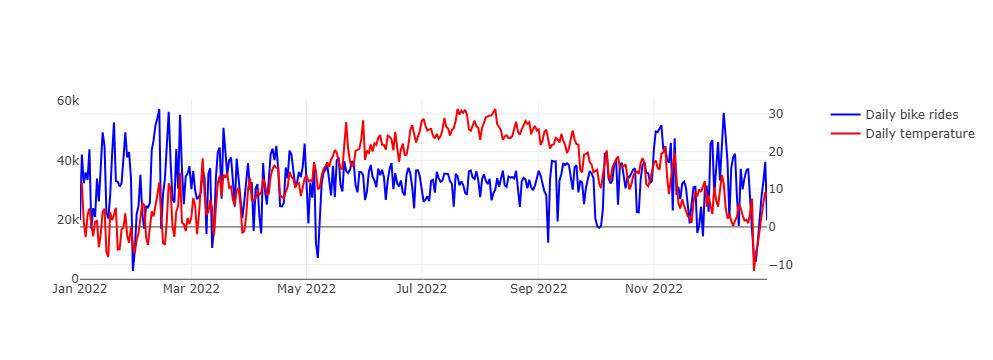

In [94]:
# Create subplot with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add daily bike rides trace
fig.add_trace(
    go.Scatter(x=df_sampled['date'], y=df_sampled['bike_rides_daily'], name='Daily bike rides',
               marker={'color': df_sampled['bike_rides_daily'],'color': 'blue'}),
    
    secondary_y=False
)

# Add daily temperature trace
fig.add_trace(
    go.Scatter(x=df_sampled['date'], y=df_sampled['avgTemp'], name='Daily temperature',
               marker={'color': df_sampled['avgTemp'],'color': 'red'}),
   
    secondary_y=True
)

# Show figure
fig.show()


In [107]:
import gc # this is a garbage collector
gc.collect()

7637

In [108]:
# Save the top 20 stations as a csv file 

top20.to_csv('Data/output/top20.csv')

In [109]:
df.columns

Index(['Unnamed: 0', 'ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', '_merge', 'value',
       'bike_rides_daily', 'merge_flag', 'trip_duration', 'month', 'season'],
      dtype='object')

### Reduce the row and column count

In [111]:
# Create a copy with fewer columns

df_1 = df.drop(columns = {'ride_id', 'rideable_type', 'started_at', 'ended_at', 'trip_duration', 'start_station_id', 'end_station_id', 'member_casual', 
        'merge_flag', 'month'}) 

##### Create a random split

In [113]:
np.random.seed(32)
red = np.random.rand(len(df_1)) <= 0.92

In [114]:
small = df_1[~red]

In [115]:
small.shape

(957804, 13)

In [116]:
df_1.shape

(11999379, 13)

In [117]:
small.to_csv('Data/output/reduced_data_to_plot.csv',index = False)

### Finding out the most used routes

In [119]:
route_counts = df.groupby(["start_station_name", "end_station_name"]).size().reset_index(name="count")


In [120]:
print(route_counts["count"].max())


4637


In [121]:
popular_routes = route_counts[route_counts["count"] > 500]


In [122]:
popular_routes.sort_values(by="count", ascending=False).head(10)


,start_station_name,end_station_name,count
564964,Roosevelt Island Tramway,Roosevelt Island Tramway,4637
395966,Grand Army Plaza & Central Park S,Grand Army Plaza & Central Park S,3714
208615,Central Park S & 6 Ave,Central Park S & 6 Ave,3525
489765,McGuinness Blvd & Eagle St,Vernon Blvd & 50 Ave,2997
207904,Central Park North & Adam Clayton Powell Blvd,Central Park North & Adam Clayton Powell Blvd,2862
72087,46 Ave & 5 St,Vernon Blvd & 50 Ave,2648
5988,1 Ave & E 68 St,1 Ave & E 78 St,2596
5118,1 Ave & E 62 St,1 Ave & E 68 St,2535
578195,Soissons Landing,Soissons Landing,2521
14305,11 Ave & W 41 St,W 34 St & 11 Ave,2479


### How can I compare the most popular start stations with the most popular end stations to better understand trip patterns?

In [124]:
import pandas as pd

# Get the counts for the most popular start and end stations
start_station_counts = df["start_station_name"].value_counts().head(10)
end_station_counts = df["end_station_name"].value_counts().head(10)

# Create a DataFrame to align the start and end station counts together
correlation_df = pd.DataFrame({
    "Start Station": start_station_counts.index,
    "Start Station Count": start_station_counts.values,
    "End Station": end_station_counts.index,
    "End Station Count": end_station_counts.values
})

# Create a new row with "Most Popular Start Station" and "Most Popular End Station"
correlation_df.columns = pd.MultiIndex.from_tuples([
    ("Most Popular Start Station", "Start Station"),
    ("Most Popular Start Station", "Start Station Count"),
    ("Most Popular End Station", "End Station"),
    ("Most Popular End Station", "End Station Count")
])

# Display the correlation DataFrame in Jupyter's default style
correlation_df


Most Popular Start Station                      Most Popular End Station  \
               Start Station Start Station Count               End Station   
0            W 21 St & 6 Ave               52627           W 21 St & 6 Ave   
1            1 Ave & E 68 St               48603        E 40 St & Park Ave   
2         Broadway & W 58 St               45270           6 Ave & W 34 St   
3      West St & Chambers St               44560           1 Ave & E 68 St   
4            6 Ave & W 33 St               41274           E 33 St & 1 Ave   
5    University Pl & E 14 St               39651   Grand St & Elizabeth St   
6            E 33 St & 1 Ave               38674  Cleveland Pl & Spring St   
7         Broadway & E 21 St               38310           1 Ave & E 78 St   
8         Broadway & E 14 St               38193           8 Ave & W 38 St   
9         Broadway & W 25 St               37976           W 31 St & 7 Ave   

                     
  End Station Count  
0             86472  
1             63866  
2             55612  
3             51330  
4             50302  
5             47881  
6             47293  
7             46917  
8             45467  
9             45419

### How can I check if there is a correlation between a station's popularity and the overall number of trips taken?

In [126]:
# Get the route counts (start and end station pair counts)
route_counts = df.groupby(["start_station_name", "end_station_name"]).size().reset_index(name="count")

# Sort the popular routes by 'count' in descending order
popular_route_correlation = route_counts.sort_values(by="count", ascending=False)

# Display the first 10 most popular routes
popular_route_correlation_top10 = popular_route_correlation.head(10)

# Create a new DataFrame with start and end stations, along with their counts
correlation_df = pd.DataFrame({
    "Start Station": popular_route_correlation_top10["start_station_name"],
    "Start Station Count": popular_route_correlation_top10["count"],
    "End Station": popular_route_correlation_top10["end_station_name"],
    "End Station Count": popular_route_correlation_top10["count"]
})

# Just type the variable name to display it as a table in Jupyter
correlation_df


,Start Station,Start Station Count,End Station,End Station Count
564964,Roosevelt Island Tramway,4637,Roosevelt Island Tramway,4637
395966,Grand Army Plaza & Central Park S,3714,Grand Army Plaza & Central Park S,3714
208615,Central Park S & 6 Ave,3525,Central Park S & 6 Ave,3525
489765,McGuinness Blvd & Eagle St,2997,Vernon Blvd & 50 Ave,2997
207904,Central Park North & Adam Clayton Powell Blvd,2862,Central Park North & Adam Clayton Powell Blvd,2862
72087,46 Ave & 5 St,2648,Vernon Blvd & 50 Ave,2648
5988,1 Ave & E 68 St,2596,1 Ave & E 78 St,2596
5118,1 Ave & E 62 St,2535,1 Ave & E 68 St,2535
578195,Soissons Landing,2521,Soissons Landing,2521
14305,11 Ave & W 41 St,2479,W 34 St & 11 Ave,2479
